In [1]:
import pandas as pd
import numpy as np
from pathlib import Path
import plotly.express as px
import json
from IPython.display import Markdown, display

In [2]:
def printmd(string):
    display(Markdown(string))

In [3]:
#PROJECT_ROOT = Path(r'C:\Users\aaimr\Desktop\Dev\wids-2022')
PROJECT_ROOT = Path(r'C:\Users\AliHashmi\Desktop\Development\wids-2022')
data_dir = PROJECT_ROOT / 'DATA'
ref_dir = PROJECT_ROOT / 'ref'

In [4]:
train_file = 'train.csv'
test_file = 'test.csv'
descr_file = 'columns.json'

In [5]:
train_df = pd.read_csv(data_dir / train_file)

In [6]:
test_df = pd.read_csv(data_dir / test_file)

In [7]:
dfs = {'TRAIN': train_df, 'TEST': test_df}

## Dataset Information

In [9]:
row_counts = {}
for df_nm, df in dfs.items():
    row_counts[df_nm] = df.shape[0]
    print(f'{df_nm} Total Rows: {df.shape[0]}')

TRAIN Total Rows: 75757
TEST Total Rows: 9705


## Column Descriptions

In [10]:
with open(ref_dir / descr_file, 'r') as js_in:
    cols_descr = json.load(js_in)
for col_nm, description in cols_descr.items():
    print(f'{col_nm.upper()}:\n\t{description}')

ID:
	building id
YEAR_FACTOR:
	anonymized year in which the weather and energy usage factors were observed
STATE_FACTOR:
	anonymized state in which the building is located
BUILDING_CLASS:
	building classification
FACILITY_TYPE:
	building usage type
FLOOR_AREA:
	floor area (in square feet) of the building
YEAR_BUILT:
	year in which the building was constructed
ENERGY_STAR_RATING:
	the energy star rating of the building
ELEVATION:
	elevation of the building location
JANUARY_MIN_TEMP:
	minimum temperature in January (in F) 
JANUARY_AVG_TEMP:
	ave temp in January (in F) 
JANUARY_MAX_TEMP:
	maximum temperature in January (in F) 
COOLING_DEGREE_DAYS:
	number of deg where the daily ave temp exceeds 65 deg F. (annual total)
HEATING_DEGREE_DAYS:
	number of deg where the daily ave temp falls under 65 deg F. (annual total)
PRECIPITATION_INCHES:
	annual precipitation in inches 
SNOWFALL_INCHES:
	annual snowfall in inches 
SNOWDEPTH_INCHES:
	annual snow depth in inches 
AVG_TEMP:
	ave temp over a y

## Target Column

In [11]:
TARGET = 'site_eui'

### Target Variable Distribution

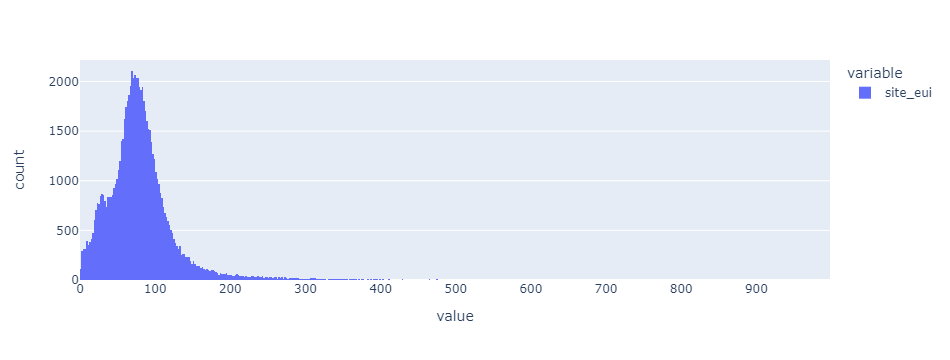

In [12]:
fig = px.histogram(train_df[TARGET])
fig.show()

## Covariates

In [13]:
for df_nm, df in dfs.items():
    print(f'{df_nm} Data --')
    numeric_cols = []
    catgry_cols = []
    for col_nm, dtype in zip(df.columns, df.dtypes):
        # drop ID & target from consideration
        if col_nm not in ['id', TARGET]:
            # consider "year-factor" column as categorical
            if dtype not in [np.int64, np.float64] or col_nm == 'Year_Factor':
                catgry_cols.append(col_nm)
            else:
                numeric_cols.append(col_nm)
        else:
            print(f'- includes {col_nm}')
    print(f'no. numeric cols: {len(numeric_cols)}')
    print(f'no. categorical cols: {len(catgry_cols)}\n')

TRAIN Data --
- includes site_eui
- includes id
no. numeric cols: 58
no. categorical cols: 4

TEST Data --
- includes id
no. numeric cols: 58
no. categorical cols: 4



# Categorical Columns

## TRAIN Data

,Year_Factor
6,22449
5,18308
4,12946
3,10879
2,9058
1,2117


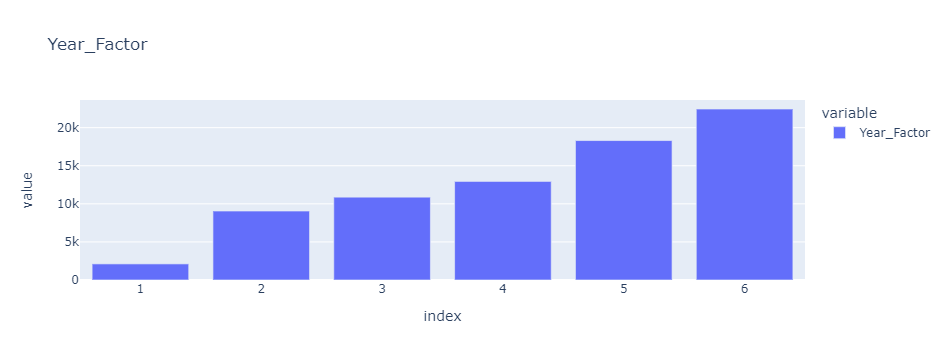

,State_Factor
State_6,50840
State_11,6412
State_1,5618
State_2,4871
State_4,4300
State_8,3701
State_10,15


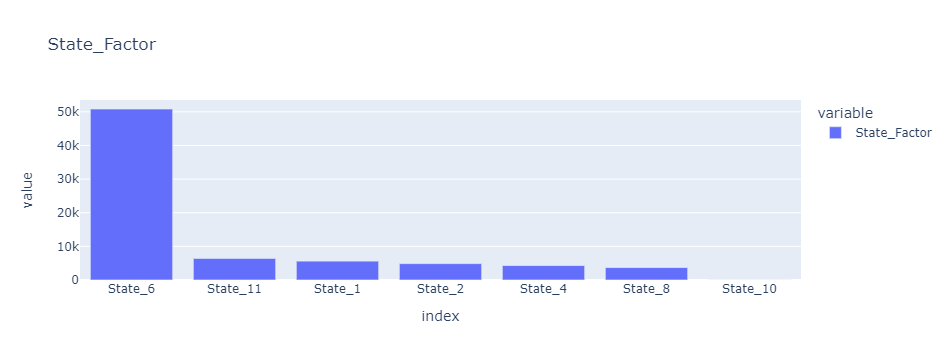

,building_class
Residential,43558
Commercial,32199


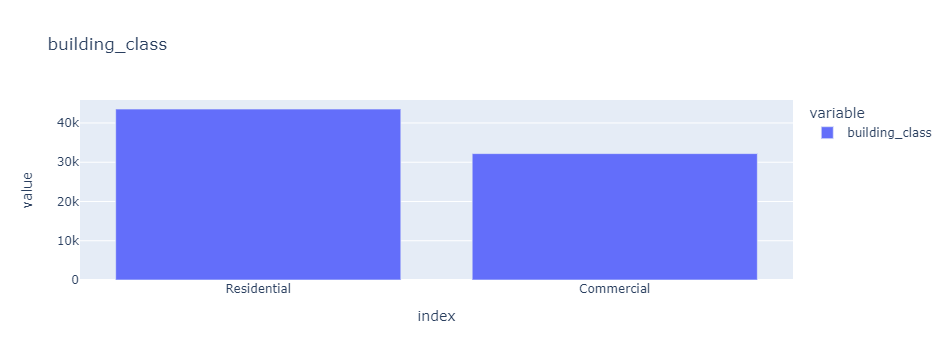

,facility_type
Multifamily_Uncategorized,39455
Office_Uncategorized,12512
Education_Other_classroom,3860
Lodging_Hotel,2098
2to4_Unit_Building,1893
Commercial_Other,1744
5plus_Unit_Building,1273
Warehouse_Nonrefrigerated,1255
Retail_Uncategorized,1130
Education_College_or_university,1056


## TEST Data

,Year_Factor
7,9705


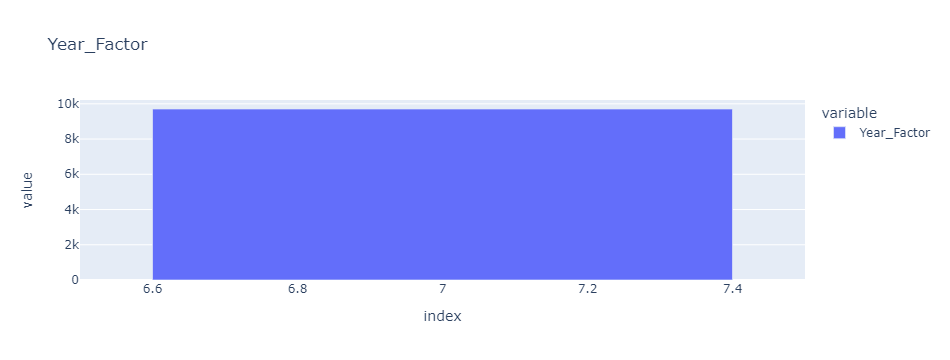

,State_Factor
State_11,3268
State_4,2568
State_2,1515
State_8,1323
State_1,1027
State_10,4


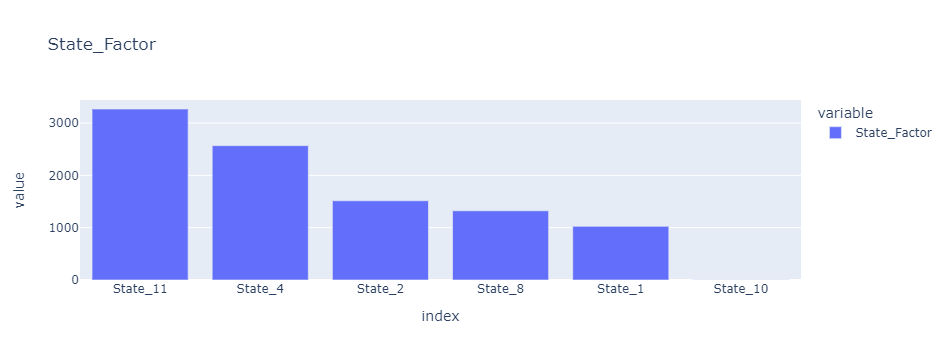

,building_class
Commercial,5607
Residential,4098


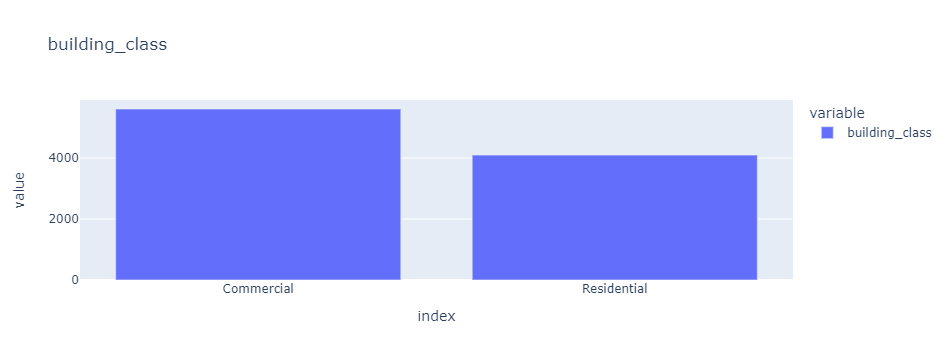

,facility_type
Multifamily_Uncategorized,2199
Office_Uncategorized,1919
2to4_Unit_Building,966
Education_Other_classroom,890
5plus_Unit_Building,685
Lodging_Hotel,367
Commercial_Other,325
Retail_Uncategorized,225
Education_College_or_university,202
Mixed_Use_Commercial_and_Residential,193


In [14]:
for df_nm, df in dfs.items():
    printmd(f'## {df_nm} Data')
    for category in catgry_cols:
        counts = pd.DataFrame(df[category].value_counts(dropna=False))
        display(counts)
        if counts.shape[0] <= 10:
            fig = px.bar(counts, title=category)
            fig.show()

# Numeric Columns

In [15]:
for df_nm, df in dfs.items():
    printmd(f'## {df_nm} Data')
    display(df.describe())

## TRAIN Data

,Year_Factor,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,site_eui,id
count,75757.000000,7.575700e+04,73920.000000,49048.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,75757.000000,...,75757.000000,75757.000000,75757.000000,75757.000000,34675.000000,33946.000000,34675.000000,29961.000000,75757.000000,75757.000000
mean,4.367755,1.659839e+05,1952.306764,61.048605,39.506323,11.432343,34.310468,59.054952,11.720567,35.526837,...,82.709809,14.058701,0.279539,0.002442,66.552675,62.779974,4.190601,109.142051,82.584693,37878.000000
std,1.471441,2.468758e+05,37.053619,28.663683,60.656596,9.381027,6.996108,5.355458,12.577272,8.866697,...,25.282913,10.943996,2.252323,0.142140,131.147834,130.308106,6.458789,50.699751,58.255403,21869.306509
min,1.000000,9.430000e+02,0.000000,0.000000,-6.400000,-19.000000,10.806452,42.000000,-13.000000,13.250000,...,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,12.000000,1.001169,0.000000
25%,3.000000,6.237900e+04,1927.000000,40.000000,11.900000,6.000000,29.827586,56.000000,2.000000,31.625000,...,72.000000,6.000000,0.000000,0.000000,1.000000,1.000000,1.000000,88.000000,54.528601,18939.000000
50%,5.000000,9.136700e+04,1951.000000,67.000000,25.000000,11.000000,34.451613,59.000000,9.000000,34.107143,...,84.000000,12.000000,0.000000,0.000000,1.000000,1.000000,1.000000,104.000000,75.293716,37878.000000
75%,6.000000,1.660000e+05,1977.000000,85.000000,42.700000,13.000000,37.322581,62.000000,20.000000,40.879310,...,97.000000,17.000000,0.000000,0.000000,1.000000,1.000000,1.000000,131.000000,97.277534,56817.000000
max,6.000000,6.385382e+06,2015.000000,100.000000,1924.500000,49.000000,64.758065,91.000000,48.000000,65.107143,...,260.000000,185.000000,119.000000,16.000000,360.000000,360.000000,23.300000,311.000000,997.866120,75756.000000


## TEST Data

,Year_Factor,floor_area,year_built,energy_star_rating,ELEVATION,january_min_temp,january_avg_temp,january_max_temp,february_min_temp,february_avg_temp,...,days_below_0F,days_above_80F,days_above_90F,days_above_100F,days_above_110F,direction_max_wind_speed,direction_peak_wind_speed,max_wind_speed,days_with_fog,id
count,9705.0,9.705000e+03,9613.000000,7451.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,9705.000000,...,9705.000000,9705.000000,9705.000000,9705.000000,9705.0,1130.000000,1130.000000,1130.000000,588.000000,9705.000000
mean,7.0,1.632143e+05,1963.219598,64.712924,205.231190,13.520762,36.678081,60.008449,21.705100,41.634886,...,1.323029,66.820093,11.941267,0.211643,0.0,321.743363,310.194690,18.131327,150.755102,80609.000000
std,0.0,2.624759e+05,40.819953,27.935984,264.822814,12.458365,6.968520,5.874699,9.774624,5.528689,...,2.205729,30.936872,13.077936,0.615250,0.0,19.127690,38.969875,1.993348,58.760576,2801.736515
min,7.0,5.982000e+03,0.000000,1.000000,1.800000,-1.000000,27.548387,42.000000,9.000000,33.428571,...,0.000000,15.000000,1.000000,0.000000,0.0,280.000000,240.000000,14.800000,34.000000,75757.000000
25%,7.0,4.802000e+04,1929.000000,45.000000,26.500000,-1.000000,27.548387,54.000000,9.000000,36.053571,...,0.000000,39.000000,3.000000,0.000000,0.0,310.000000,270.000000,16.500000,129.000000,78183.000000
50%,7.0,8.248600e+04,1969.000000,72.000000,118.900000,15.000000,38.661290,59.000000,22.000000,41.625000,...,0.000000,77.000000,5.000000,0.000000,0.0,330.000000,320.000000,18.300000,129.000000,80609.000000
75%,7.0,1.775200e+05,1994.000000,88.000000,231.300000,21.000000,41.177419,64.000000,28.000000,45.685185,...,5.000000,79.000000,12.000000,0.000000,0.0,340.000000,340.000000,19.200000,138.000000,83035.000000
max,7.0,6.353396e+06,2016.000000,100.000000,812.000000,38.000000,50.596774,71.000000,40.000000,54.482143,...,5.000000,122.000000,41.000000,2.000000,0.0,360.000000,350.000000,23.300000,250.000000,85461.000000


# Missing Values

## TRAIN Data

No. of columns w/ missing values: 6


,N,%
index,,
year_built,1837,2.424858
energy_star_rating,26709,35.256148
direction_max_wind_speed,41082,54.228652
direction_peak_wind_speed,41811,55.190939
max_wind_speed,41082,54.228652
days_with_fog,45796,60.451179


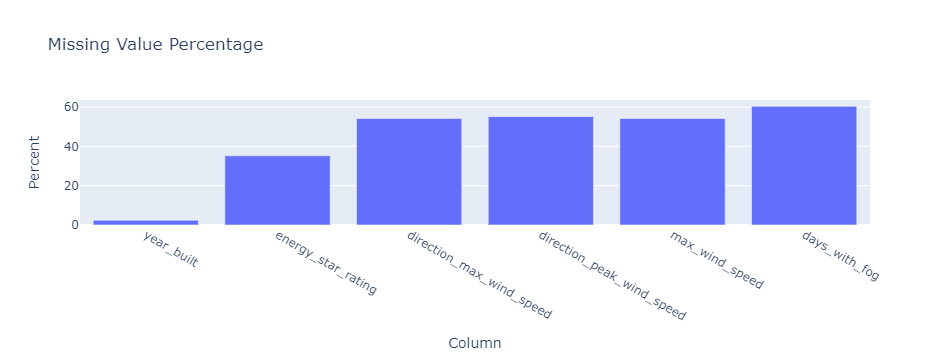

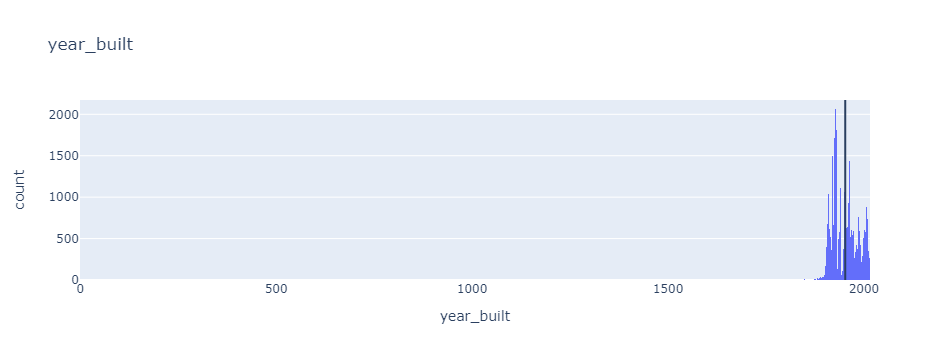

count    73920.000000
mean      1952.306764
std         37.053619
min          0.000000
25%       1927.000000
50%       1951.000000
75%       1977.000000
max       2015.000000
Name: year_built, dtype: float64

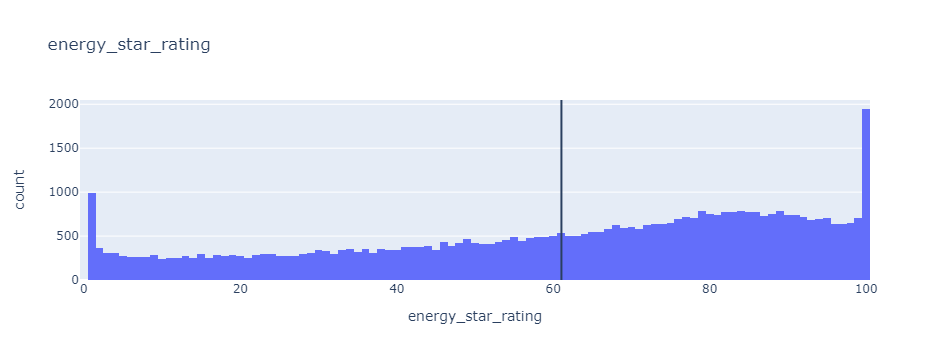

count    49048.000000
mean        61.048605
std         28.663683
min          0.000000
25%         40.000000
50%         67.000000
75%         85.000000
max        100.000000
Name: energy_star_rating, dtype: float64

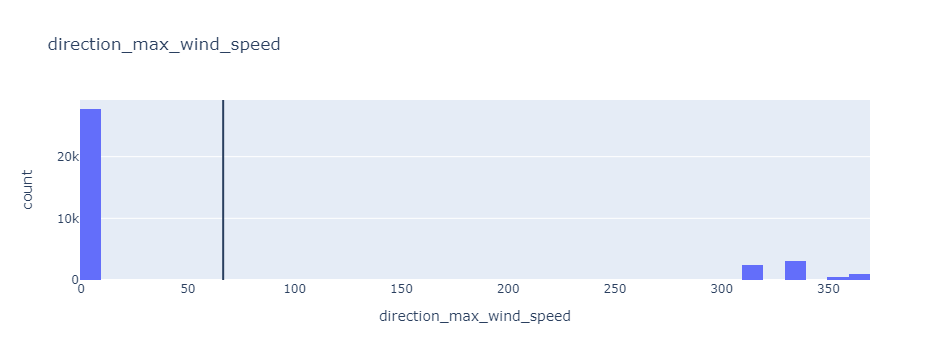

count    34675.000000
mean        66.552675
std        131.147834
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max        360.000000
Name: direction_max_wind_speed, dtype: float64

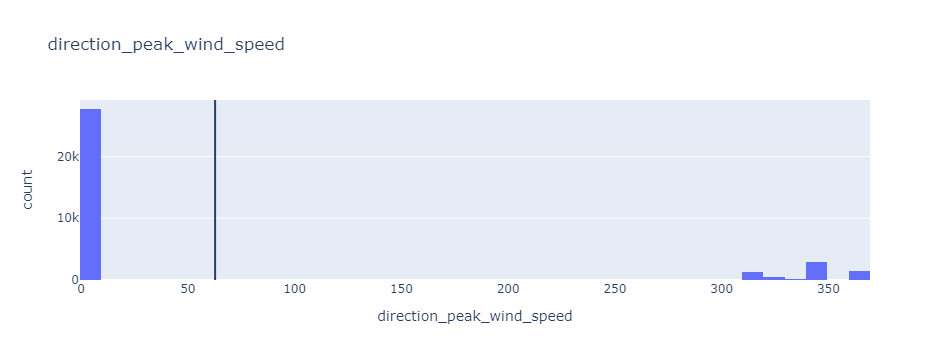

count    33946.000000
mean        62.779974
std        130.308106
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max        360.000000
Name: direction_peak_wind_speed, dtype: float64

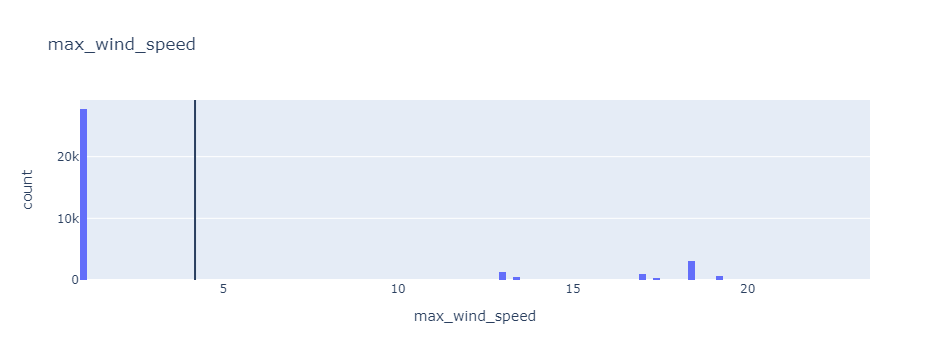

count    34675.000000
mean         4.190601
std          6.458789
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         23.300000
Name: max_wind_speed, dtype: float64

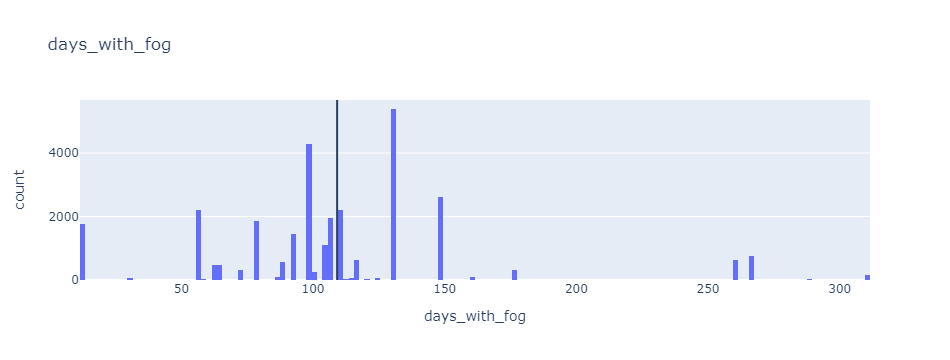

count    29961.000000
mean       109.142051
std         50.699751
min         12.000000
25%         88.000000
50%        104.000000
75%        131.000000
max        311.000000
Name: days_with_fog, dtype: float64

## TEST Data

No. of columns w/ missing values: 6


,N,%
index,,
year_built,92,0.947965
energy_star_rating,2254,23.225142
direction_max_wind_speed,8575,88.356517
direction_peak_wind_speed,8575,88.356517
max_wind_speed,8575,88.356517
days_with_fog,9117,93.941267


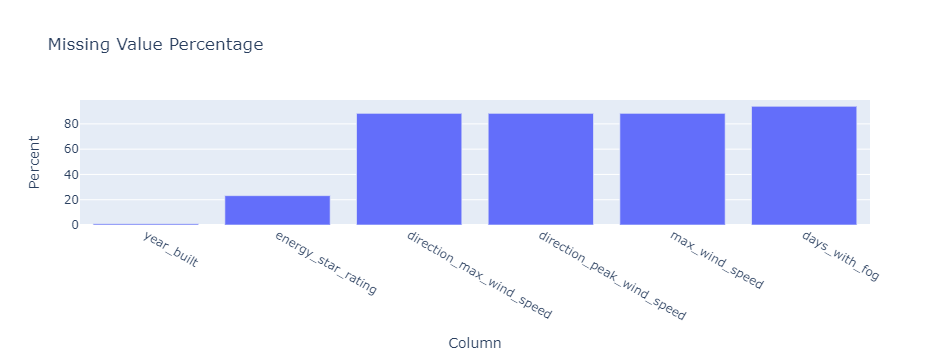

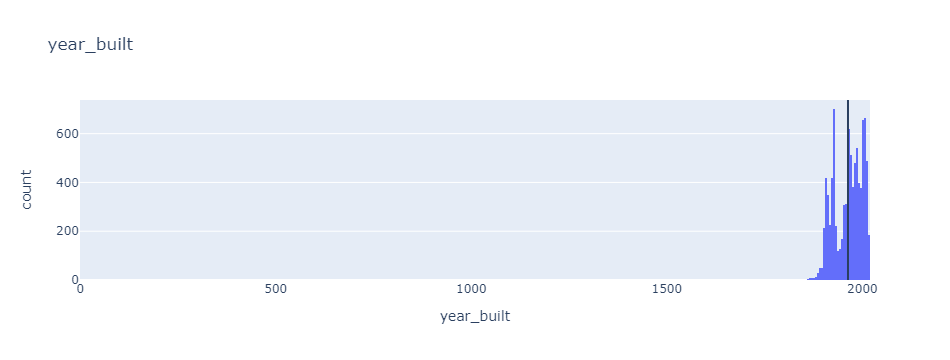

count    9613.000000
mean     1963.219598
std        40.819953
min         0.000000
25%      1929.000000
50%      1969.000000
75%      1994.000000
max      2016.000000
Name: year_built, dtype: float64

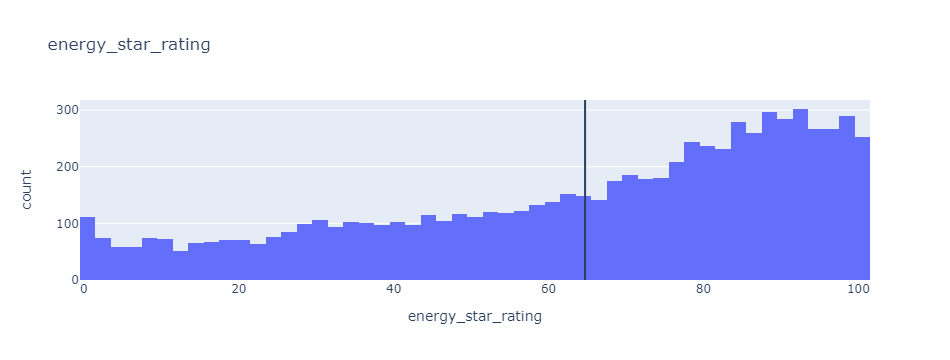

count    7451.000000
mean       64.712924
std        27.935984
min         1.000000
25%        45.000000
50%        72.000000
75%        88.000000
max       100.000000
Name: energy_star_rating, dtype: float64

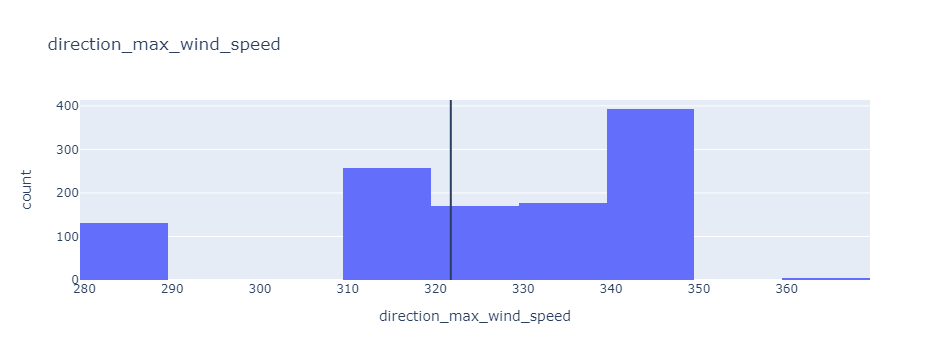

count    1130.000000
mean      321.743363
std        19.127690
min       280.000000
25%       310.000000
50%       330.000000
75%       340.000000
max       360.000000
Name: direction_max_wind_speed, dtype: float64

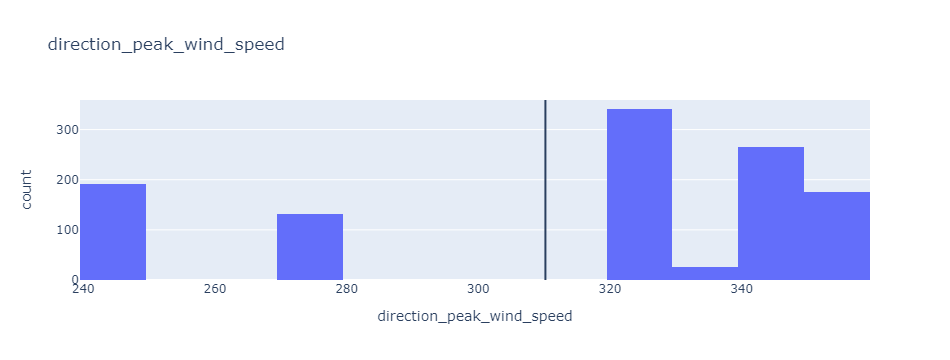

count    1130.000000
mean      310.194690
std        38.969875
min       240.000000
25%       270.000000
50%       320.000000
75%       340.000000
max       350.000000
Name: direction_peak_wind_speed, dtype: float64

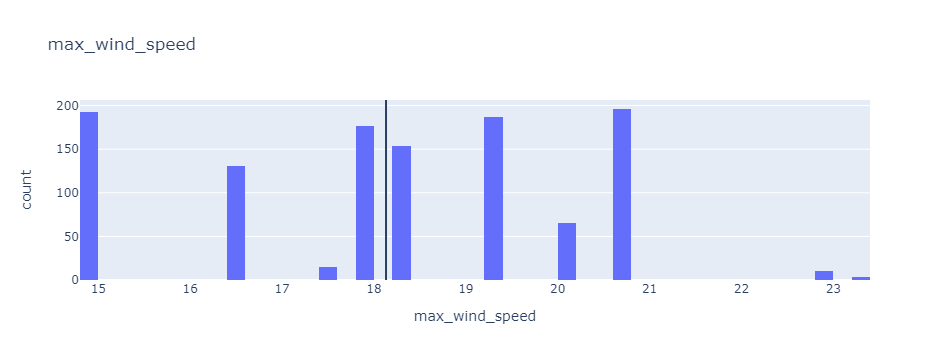

count    1130.000000
mean       18.131327
std         1.993348
min        14.800000
25%        16.500000
50%        18.300000
75%        19.200000
max        23.300000
Name: max_wind_speed, dtype: float64

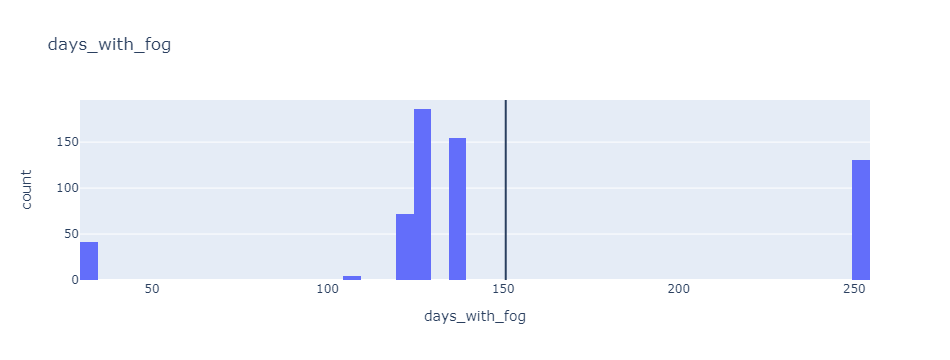

count    588.000000
mean     150.755102
std       58.760576
min       34.000000
25%      129.000000
50%      129.000000
75%      138.000000
max      250.000000
Name: days_with_fog, dtype: float64

In [16]:
for df_nm, df in dfs.items():
    printmd(f'## {df_nm} Data')
    cols_missing = df.isna().sum().reset_index(name='N')
    cols_missing = cols_missing[cols_missing['N'] > 0]
    cols_missing['%'] = cols_missing['N'] / row_counts[df_nm] * 100
    print(f'No. of columns w/ missing values: {cols_missing.shape[0]}')
    cols_missing.set_index('index', inplace=True)
    display(cols_missing)
    fig = px.bar(cols_missing, 
                 x=cols_missing.index, y='%', 
                 labels={'index':'Column', '%':'Percent'},
                 hover_data=['N'],
                 title='Missing Value Percentage'
                )
    fig.show()
    missing_cols = cols_missing.index.to_list()
    for miss_col in missing_cols:
        miss_series = df[miss_col]
        stats = miss_series.describe()
        fig = px.histogram(miss_series, x=miss_col, title=f'{miss_col}')
        fig.add_vline(x=stats['mean'])
        fig.show()
        display(stats)